In [1]:
import os
import gc
import glob
import math
import random
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
from PIL import Image
import seaborn as sns
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim.lr_scheduler import CosineAnnealingWarmRestarts
from torch.utils.data import DataLoader, Dataset, random_split
from torchvision import utils

import albumentations as A
from albumentations.pytorch import ToTensorV2

import sys
import pickle
# sys.path.append('../input/timm-pytorch-image-models/pytorch-image-models-master')
sys.path.append('../input/rangerdeeplearningoptimizer/ranger')
# import timm
import wandb
from ranger import Ranger

device='cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [2]:
class Mish_layer(nn.Module):
    '''
    The class represents Mish activation function.
    '''
    def __init__(self):
        super(Mish_layer,self).__init__()
    def forward(self,x):
        return x*torch.tanh(F.softplus(x))

In [3]:
def set_seed(seed):
    #Sets the seed for Reprocudibility
    random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        
set_seed(7)

In [4]:
from kaggle_secrets import UserSecretsClient

user_secrets = UserSecretsClient()
wandb_key = user_secrets.get_secret("wandb") 

wandb.login(key = wandb_key)

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [5]:
config = dict(
    batch_size = 256,
    epochs = 300,
    learning_rate = 2e-3
    )

In [6]:
def img_paths_list(root_dir):
    root_list = glob.glob(root_dir)
    data = []
    for img_path in tqdm(root_list):
        data.append(img_path)
        
    return data

In [7]:
data_root_dir = r'../input/gsocml4scimodel2/Model_II/axion/*'
dataset_img_paths_list = img_paths_list(data_root_dir)

test_data_root_dir = r'../input/gsocml4scimodel2test/Model_II_test/axion/*'
test_paths_list = img_paths_list(test_data_root_dir)

  0%|          | 0/29896 [00:00<?, ?it/s]

  0%|          | 0/5000 [00:00<?, ?it/s]

In [8]:
val_split = int(0.1 * len(dataset_img_paths_list))

random.shuffle(dataset_img_paths_list)

val_paths_list = dataset_img_paths_list[:val_split]
train_paths_list = dataset_img_paths_list[val_split:]

assert len(dataset_img_paths_list) == (len(train_paths_list) + len(val_paths_list))

len(train_paths_list), len(val_paths_list), len(test_paths_list)

(26907, 2989, 5000)

In [9]:
def pickelize_file(dicto, pickle_path):
    file_to_write = open(pickle_path, "wb")
    pickle.dump(dicto, file_to_write)
    
    print("Pickleized successfully!")
    
pickelize_file(train_paths_list, "train_paths_list.pickle")
pickelize_file(val_paths_list, "val_paths_list.pickle")

Pickleized successfully!
Pickleized successfully!


In [10]:
class CustomDataset(Dataset):
    def __init__(self, img_paths_and_labels_list,transform = None):
        self.data = img_paths_and_labels_list
        self.transform = transform
            
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        path = self.data[idx]
        array = np.load(path, allow_pickle = True)
        img = array[0]
        img = img.astype('float32')
        mass = torch.tensor(-(math.log10(array[1])))
       
        if self.transform:
            aug = self.transform(image = img)
            img = aug['image']      

        return img, mass

In [11]:
train_transforms = A.Compose(
            [
                A.HorizontalFlip(p = 0.5),
                A.VerticalFlip(p = 0.5),
                A.Rotate(limit = 360, p = 0.4),
                ToTensorV2()
            ]
        )


test_transforms = A.Compose(
            [
                ToTensorV2()
            ]
        )

In [12]:
train_dataset = CustomDataset(train_paths_list, transform = test_transforms)
print(len(train_dataset))

val_dataset = CustomDataset(val_paths_list, transform = test_transforms)
print(len(val_dataset))

test_dataset = CustomDataset(test_paths_list,transform = test_transforms)
print(len(test_dataset))

26907
2989
5000


In [13]:
train_loader = DataLoader(train_dataset, batch_size = config['batch_size'], shuffle = True, num_workers = 2)
val_loader = DataLoader(val_dataset, batch_size = config['batch_size'], shuffle = False, num_workers = 2)
test_loader = DataLoader(test_dataset, batch_size = config['batch_size'], shuffle = False, num_workers = 2)

In [14]:
single_batch = next(iter(test_loader))
single_batch[0].shape

torch.Size([256, 1, 64, 64])

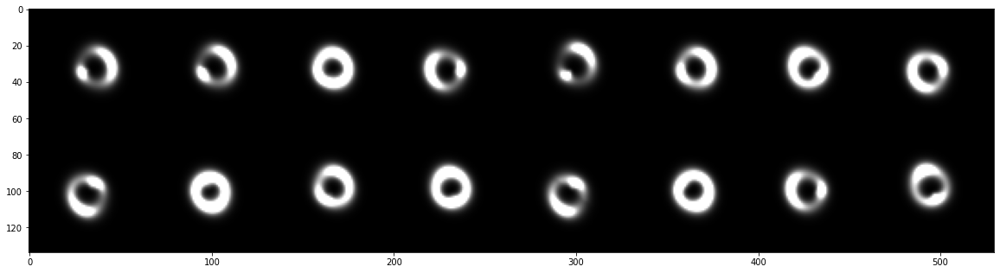

In [15]:
single_batch_grid = utils.make_grid(single_batch[0][:16], nrow=8)
plt.figure(figsize = (20,70))
plt.imshow(single_batch_grid.permute(1, 2, 0))

In [16]:
class Regressor(nn.Module):
    
    def __init__(self, in_channels = 1):
        super().__init__()
        
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels = in_channels, out_channels = 16, kernel_size = 7, stride = 2),
            nn.BatchNorm2d(16),
            Mish_layer(),

            nn.Conv2d(16, 32, 7, stride = 2),
            nn.BatchNorm2d(32),
            Mish_layer(),
            
            nn.Conv2d(32, 64, 7),
            nn.BatchNorm2d(64),
            Mish_layer(),
        )
        self.flat = nn.Flatten()
        self.fc = nn.Sequential(
                                nn.Linear(2304, 1024),
                                Mish_layer(),
                                nn.BatchNorm1d(1024),
                                nn.Dropout(p = 0.3),
                                
                                nn.Linear(1024, 512),
                                Mish_layer(),
                                nn.BatchNorm1d(512),
                                nn.Dropout(p = 0.2),
        
                                nn.Linear(512, 256),
                                Mish_layer(),
                                nn.BatchNorm1d(256),
                                
                                nn.Linear(256, 1)
                                )
        
    def forward(self, x):
        x = self.conv(x)
        x = self.flat(x)
        x = self.fc(x)
        return x

In [17]:
model = Regressor()
bs, ch, h, w = single_batch[0].shape
x = torch.randn(bs, ch, h, w)

print(model(x).shape)

del model, x
gc.collect()

torch.Size([256, 1])


21

In [18]:
def train_epoch(model, dataloader, criterion, optimizer, scheduler, example_ct):
    
    model.train()
    train_loss = []

    loop=tqdm(enumerate(dataloader),total = len(dataloader))

    for batch_idx, (img_batch,labels) in loop:

        X = img_batch.to(device)
        y_truth = labels.to(device)
        example_ct += len(img_batch)
        
        #forward prop
        y_pred = model(X)
        y_pred = y_pred.view(-1)
        #loss calculation
        loss = criterion(y_pred, y_truth)

        #backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        scheduler.step()

        #batch loss
        train_loss.append(loss.detach().cpu().numpy())

    return model, np.mean(train_loss), example_ct

In [19]:
def test_epoch(model, dataloader,criterion):

    model.eval()
    losses = []
    
    y_pred_list = []
    y_truth_list = []

    with torch.no_grad():

        loop=tqdm(enumerate(dataloader),total=len(dataloader))
        
        for batch_idx, (img_batch,masses) in loop:
            X = img_batch.to(device)
            y_truth = masses.to(device)
            y_truth_list.append(y_truth.detach().cpu().numpy())

            #forward prop
            y_pred = model(X)
            y_pred = y_pred.view(-1)
            
            y_pred_list.append(y_pred.detach().cpu().numpy())

            #loss and accuracy calculation
            loss = criterion(y_pred, y_truth)


            #batch loss and accuracy
            # print(f'Partial train loss: {loss.data}')
            losses.append(loss.detach().cpu().numpy())

            
    return y_pred_list, y_truth_list, np.mean(losses)

In [20]:
def plot_results(model, dataloader, criterion, epoch):
    y_pred_list, y_truth_list, test_loss = test_epoch(model, test_loader, criterion)
    
    def flatten_list(x):
        flattened_list = []
        for i in x:
            for j in i:
                flattened_list.append(j)

        return flattened_list
    
    y_pred_list_flattened = flatten_list(y_pred_list)
    y_truth_list_flattened = flatten_list(y_truth_list)
    
    plt.figure(figsize=(9,9))
    plt.scatter(y_truth_list_flattened, y_pred_list_flattened)
    plt.xlabel('Observed mass')
    plt.ylabel('Predicted mass')
    
    plot_name = f"val_plot"
    plt.savefig(plot_name, format="png", dpi=80)  
    pic = Image.open(plot_name)
    
    wandb.log({plot_name: [wandb.Image(pic, caption = f"Epoch : {epoch+1}")]})

In [21]:
def fit_model(model, config, checkpoint_path):
    
        # access all HPs through wandb.config, so logging matches execution!
        config = wandb.config

        EPOCHS = config.epochs
        LR = config.learning_rate
#         optimizer = optim.Adam(model.parameters(),lr = LR)
        optimizer = Ranger(model.parameters(), lr = LR)
        scheduler = optim.lr_scheduler.OneCycleLR(optimizer, LR, epochs = EPOCHS, steps_per_epoch = len(train_loader), verbose = False)
#         scheduler = CosineAnnealingWarmRestarts(optimizer,T_0 = 10, T_mult = 1,eta_min = 1e-6, verbose=True)
        criterion = nn.MSELoss()

        loss_dict = {'train_loss':[],'val_loss':[]}
        
        example_ct = 0  # number of examples seen
        min_val_loss = 999 #high value to initlialize

        wandb.watch(model, criterion, log="all", log_freq = 10)
        for epoch in range(EPOCHS):
            print(f"Epoch {epoch+1}/{EPOCHS}:")
            model, train_loss, example_ct = train_epoch(model, train_loader, criterion, optimizer, scheduler, example_ct)
            _, _, val_loss = test_epoch(model, val_loader, criterion)
            
            if val_loss < min_val_loss:
                min_val_loss = val_loss
                print("New lower val loss. Saving model checkpoint!")
                torch.save(model.state_dict(), checkpoint_path)


            print(f'Train loss:{train_loss}, Val loss:{val_loss}')
            wandb.log({"epoch": epoch + 1, "train_loss":train_loss, "val_loss": val_loss}, step = example_ct)

            loss_dict['train_loss'].append(train_loss)
            loss_dict['val_loss'].append(val_loss)

            if epoch % 3 == 0 or epoch + 1 == EPOCHS:
                plot_results(model, val_loader, criterion, epoch)


        return model, loss_dict

In [22]:
wandb.init(project="gsoc_model2-reg", config = config)

wandb: Currently logged in as: saranga7. Use `wandb login --relogin` to force relogin


In [23]:
model = Regressor().to(device)

Ranger optimizer loaded. 
Gradient Centralization usage = True
GC applied to both conv and fc layers
Epoch 1/300:


  0%|          | 0/106 [00:00<?, ?it/s]

../input/rangerdeeplearningoptimizer/ranger/ranger.py:138: UserWarning: This overload of addcmul_ is deprecated:
	addcmul_(Number value, Tensor tensor1, Tensor tensor2)
Consider using one of the following signatures instead:
	addcmul_(Tensor tensor1, Tensor tensor2, *, Number value) (Triggered internally at  /usr/local/src/pytorch/torch/csrc/utils/python_arg_parser.cpp:1055.)
  exp_avg_sq.mul_(beta2).addcmul_(1 - beta2, grad, grad)


  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:528.2755737304688, Val loss:533.0009155273438


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:527.6754760742188, Val loss:531.76025390625
Epoch 3/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:526.9271240234375, Val loss:529.6546630859375
Epoch 4/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:526.0474243164062, Val loss:528.12451171875


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 5/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:524.736083984375, Val loss:526.8712768554688
Epoch 6/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:522.7687377929688, Val loss:524.5562744140625
Epoch 7/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:520.10400390625, Val loss:521.601806640625


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 8/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:516.2806396484375, Val loss:511.24072265625
Epoch 9/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:511.1688537597656, Val loss:509.3572692871094
Epoch 10/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:504.1579895019531, Val loss:501.9177551269531


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 11/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:494.8406982421875, Val loss:490.8475036621094
Epoch 12/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:482.6131591796875, Val loss:475.751708984375
Epoch 13/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:466.7606201171875, Val loss:453.5166320800781


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 14/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:446.853515625, Val loss:438.43505859375
Epoch 15/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:422.03411865234375, Val loss:408.6407470703125
Epoch 16/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:391.9853210449219, Val loss:375.0350341796875


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 17/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:356.255615234375, Val loss:338.3017883300781
Epoch 18/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:315.314208984375, Val loss:294.38043212890625
Epoch 19/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:269.8211364746094, Val loss:247.13880920410156


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 20/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:221.37109375, Val loss:193.7203826904297
Epoch 21/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:172.2019500732422, Val loss:148.14089965820312
Epoch 22/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:125.37504577636719, Val loss:101.89376831054688


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 23/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:83.99089813232422, Val loss:66.93038177490234
Epoch 24/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:50.79111862182617, Val loss:37.392520904541016
Epoch 25/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:27.116188049316406, Val loss:18.969697952270508


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 26/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:12.516807556152344, Val loss:7.675376892089844
Epoch 27/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:4.89643669128418, Val loss:2.8572094440460205
Epoch 28/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:1.6291848421096802, Val loss:0.7974493503570557


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 29/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:0.4800611436367035, Val loss:0.1863120198249817
Epoch 30/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:0.15834574401378632, Val loss:0.06657332926988602
Epoch 31/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.07953430712223053, Val loss:0.07307328283786774


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 32/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:0.0665469765663147, Val loss:0.05728442594408989
Epoch 33/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.06420961767435074, Val loss:0.05880885198712349
Epoch 34/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.05834076181054115, Val loss:0.15655207633972168


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 35/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:0.057722918689250946, Val loss:0.05470578372478485
Epoch 36/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:0.05535848066210747, Val loss:0.03464667126536369
Epoch 37/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.05148175358772278, Val loss:0.10568082332611084


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 38/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.052659448236227036, Val loss:0.22992146015167236
Epoch 39/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:0.048513904213905334, Val loss:0.02577303908765316
Epoch 40/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.046361394226551056, Val loss:0.03872038796544075


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 41/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.046050988137722015, Val loss:0.08561105281114578
Epoch 42/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.04349266365170479, Val loss:0.07750885933637619
Epoch 43/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.04485393315553665, Val loss:0.08877017349004745


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 44/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.045478738844394684, Val loss:0.0808367058634758
Epoch 45/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.04425785690546036, Val loss:0.03330522030591965
Epoch 46/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.04250708967447281, Val loss:0.04028310254216194


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 47/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03904157876968384, Val loss:0.16985340416431427
Epoch 48/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.042217232286930084, Val loss:0.0503290630877018
Epoch 49/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.042030248790979385, Val loss:0.0694458857178688


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 50/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03958673030138016, Val loss:0.10398975014686584
Epoch 51/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.0410369336605072, Val loss:0.046813178807497025
Epoch 52/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03961949422955513, Val loss:0.05748608335852623


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 53/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03708479925990105, Val loss:0.2065458744764328
Epoch 54/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03684825822710991, Val loss:0.0767313539981842
Epoch 55/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.036192502826452255, Val loss:0.053346436470746994


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 56/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.035860564559698105, Val loss:0.10697460919618607
Epoch 57/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03835798799991608, Val loss:0.3158737123012543
Epoch 58/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:1.4684877395629883, Val loss:0.30192556977272034


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 59/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.24324119091033936, Val loss:0.18372882902622223
Epoch 60/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.14481517672538757, Val loss:0.07848332822322845
Epoch 61/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.11455640196800232, Val loss:0.20464526116847992


  0%|          | 0/20 [00:00<?, ?it/s]

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  from ipykernel import kernelapp as app


Epoch 62/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.09610514342784882, Val loss:0.07677022367715836
Epoch 63/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.0834658220410347, Val loss:0.046459440141916275
Epoch 64/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.07615657895803452, Val loss:0.08526790142059326


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 65/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.07234283536672592, Val loss:0.05045954883098602
Epoch 66/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.06836184859275818, Val loss:0.04343516007065773
Epoch 67/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.061979740858078, Val loss:0.05414378643035889


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 68/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.06953834742307663, Val loss:0.6175764203071594
Epoch 69/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.10189949721097946, Val loss:0.07582268863916397
Epoch 70/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.06533775478601456, Val loss:0.105673648416996


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 71/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.05783630907535553, Val loss:0.18105728924274445
Epoch 72/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.05816977471113205, Val loss:0.11903006583452225
Epoch 73/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.05473153665661812, Val loss:0.09519025683403015


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 74/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.05062510073184967, Val loss:0.10731229931116104
Epoch 75/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.050523851066827774, Val loss:0.06369533389806747
Epoch 76/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.04702264070510864, Val loss:0.07003463059663773


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 77/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.045588672161102295, Val loss:0.1670597791671753
Epoch 78/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.045503340661525726, Val loss:0.043013110756874084
Epoch 79/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.044183120131492615, Val loss:0.5603955388069153


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 80/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.04743671417236328, Val loss:0.03478437289595604
Epoch 81/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.039705075323581696, Val loss:0.11560237407684326
Epoch 82/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.04173560440540314, Val loss:0.16651616990566254


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 83/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.04184173792600632, Val loss:0.1017114594578743
Epoch 84/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03971628099679947, Val loss:0.14977501332759857
Epoch 85/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.04361499100923538, Val loss:0.12524016201496124


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 86/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03882204368710518, Val loss:0.044298529624938965
Epoch 87/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:0.036713238805532455, Val loss:0.019223665818572044
Epoch 88/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03527108579874039, Val loss:0.13692523539066315


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 89/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03872521594166756, Val loss:0.5185032486915588
Epoch 90/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.32758474349975586, Val loss:0.07102391868829727
Epoch 91/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.08296449482440948, Val loss:0.10459914058446884


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 92/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.06434241682291031, Val loss:0.06556408852338791
Epoch 93/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.055430080741643906, Val loss:0.033509816974401474
Epoch 94/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.05264653265476227, Val loss:0.13931141793727875


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 95/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.046827223151922226, Val loss:0.04601871967315674
Epoch 96/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.04358195886015892, Val loss:0.03705630078911781
Epoch 97/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03986836224794388, Val loss:0.18812865018844604


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 98/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.04016661271452904, Val loss:0.04598066583275795
Epoch 99/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03784437105059624, Val loss:0.03161054477095604
Epoch 100/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03690287098288536, Val loss:0.04314076527953148


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 101/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03541315719485283, Val loss:0.052212778478860855
Epoch 102/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03756679221987724, Val loss:0.5139597058296204
Epoch 103/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.058626048266887665, Val loss:0.08992008119821548


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 104/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.038458820432424545, Val loss:0.11118433624505997
Epoch 105/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03953611105680466, Val loss:0.026589184999465942
Epoch 106/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03541657701134682, Val loss:0.0797366201877594


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 107/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.034550271928310394, Val loss:0.3409169614315033
Epoch 108/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.046362847089767456, Val loss:0.0325346402823925
Epoch 109/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03206322714686394, Val loss:0.08926726132631302


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 110/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03211652487516403, Val loss:0.09250818938016891
Epoch 111/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.032594289630651474, Val loss:0.05072410777211189
Epoch 112/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03226369619369507, Val loss:0.056407902389764786


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 113/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03595013916492462, Val loss:25.84918212890625
Epoch 114/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.08673176914453506, Val loss:0.031709495931863785
Epoch 115/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.04271337389945984, Val loss:0.06912222504615784


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 116/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03703915700316429, Val loss:0.08242706209421158
Epoch 117/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.0333278551697731, Val loss:0.032483432441949844
Epoch 118/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.029023438692092896, Val loss:0.05432632938027382


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 119/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.028705231845378876, Val loss:0.03467065468430519
Epoch 120/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03296275809407234, Val loss:0.3665567934513092
Epoch 121/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.17347611486911774, Val loss:0.13493165373802185


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 122/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.07078112661838531, Val loss:0.06036365032196045
Epoch 123/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.05553015321493149, Val loss:0.046403128653764725
Epoch 124/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.04995476081967354, Val loss:0.20195148885250092


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 125/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.057771507650613785, Val loss:0.04980626329779625
Epoch 126/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.04306219518184662, Val loss:0.033367857336997986
Epoch 127/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.039253946393728256, Val loss:0.06499218195676804


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 128/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.036788489669561386, Val loss:0.07036644965410233
Epoch 129/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03378496319055557, Val loss:0.0226474329829216
Epoch 130/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03398318216204643, Val loss:0.0959698036313057


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 131/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.033991776406764984, Val loss:0.036743972450494766
Epoch 132/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03192241117358208, Val loss:0.02750398777425289
Epoch 133/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03090105578303337, Val loss:0.038142453879117966


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 134/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.029260149225592613, Val loss:0.04563641920685768
Epoch 135/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.032489433884620667, Val loss:0.029337726533412933
Epoch 136/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.028924962505698204, Val loss:0.11652673035860062


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 137/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.032899484038352966, Val loss:7902.39599609375
Epoch 138/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.10781336575746536, Val loss:0.03343798965215683
Epoch 139/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.04533437639474869, Val loss:0.0725536122918129


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 140/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03344140201807022, Val loss:0.07162753492593765
Epoch 141/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03867249935865402, Val loss:0.07868252694606781
Epoch 142/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.0345689095556736, Val loss:0.04926561191678047


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 143/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.029814960435032845, Val loss:0.03216974064707756
Epoch 144/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.028794322162866592, Val loss:0.03827090188860893
Epoch 145/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.027516884729266167, Val loss:0.06879033148288727


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 146/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.026505960151553154, Val loss:0.07299415022134781
Epoch 147/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:0.025155846029520035, Val loss:0.01871676929295063
Epoch 148/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.026031475514173508, Val loss:0.048693280667066574


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 149/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.025169145315885544, Val loss:0.04755308851599693
Epoch 150/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:0.025687333196401596, Val loss:0.017109910026192665
Epoch 151/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02257505990564823, Val loss:0.03027413785457611


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 152/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.024446262046694756, Val loss:0.053406018763780594
Epoch 153/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02414320409297943, Val loss:0.020169591531157494
Epoch 154/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.026161780580878258, Val loss:0.03279897943139076


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 155/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.022509420290589333, Val loss:0.035571642220020294
Epoch 156/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:0.0228574238717556, Val loss:0.013367812149226665
Epoch 157/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02367703802883625, Val loss:71.17095947265625


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 158/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.035607170313596725, Val loss:0.02138439752161503
Epoch 159/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:0.02450057864189148, Val loss:0.012700822204351425
Epoch 160/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02155405841767788, Val loss:0.08413520455360413


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 161/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.026174861937761307, Val loss:0.07024548202753067
Epoch 162/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.022465217858552933, Val loss:0.01356172189116478
Epoch 163/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.021292483434081078, Val loss:0.027295509353280067


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 164/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.0214881282299757, Val loss:0.028828240931034088
Epoch 165/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:0.020517956465482712, Val loss:0.011831150390207767
Epoch 166/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.021120594814419746, Val loss:0.027774669229984283


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 167/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.020328383892774582, Val loss:0.030580157414078712
Epoch 168/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.019773760810494423, Val loss:0.013221238739788532
Epoch 169/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.019130390137434006, Val loss:0.045121025294065475


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 170/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02123209834098816, Val loss:33.25441360473633
Epoch 171/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.05950511619448662, Val loss:0.02124396711587906
Epoch 172/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02798108570277691, Val loss:0.06652724742889404


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 173/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.023754145950078964, Val loss:0.059906914830207825
Epoch 174/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.022714655846357346, Val loss:0.022315986454486847
Epoch 175/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02263648994266987, Val loss:0.03266812488436699


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 176/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02014217898249626, Val loss:0.038260072469711304
Epoch 177/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.020319579169154167, Val loss:0.01367074716836214
Epoch 178/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.018676836043596268, Val loss:0.033845748752355576


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 179/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.019509123638272285, Val loss:0.040674686431884766
Epoch 180/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.021199673414230347, Val loss:0.03917822614312172
Epoch 181/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.01893443427979946, Val loss:0.05346664413809776


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 182/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.01779767870903015, Val loss:0.026874901726841927
Epoch 183/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.017703192308545113, Val loss:0.022700734436511993
Epoch 184/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.01592106930911541, Val loss:0.022129623219370842


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 185/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.01669052243232727, Val loss:0.031101854518055916
Epoch 186/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.01625262200832367, Val loss:0.03176765516400337
Epoch 187/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.0187896229326725, Val loss:0.03413000330328941


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 188/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.017584647983312607, Val loss:0.031385812908411026
Epoch 189/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.017576351761817932, Val loss:0.035071101039648056
Epoch 190/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.01848648674786091, Val loss:0.07806966453790665


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 191/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.015985099598765373, Val loss:0.02351943589746952
Epoch 192/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.017497742548584938, Val loss:0.012523136101663113
Epoch 193/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.016104575246572495, Val loss:0.10078230500221252


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 194/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.018141942098736763, Val loss:59.623287200927734
Epoch 195/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.06438170373439789, Val loss:0.017207520082592964
Epoch 196/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02775869145989418, Val loss:0.03600361570715904


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 197/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.0225684754550457, Val loss:0.027383437380194664
Epoch 198/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.024934468790888786, Val loss:0.024586936458945274
Epoch 199/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.022968268021941185, Val loss:0.03382311388850212


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 200/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:0.018249519169330597, Val loss:0.011445407755672932
Epoch 201/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:0.016072077676653862, Val loss:0.009220724925398827
Epoch 202/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.016560235992074013, Val loss:0.016106514260172844


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 203/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.01661764830350876, Val loss:0.02000887133181095
Epoch 204/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.014425152912735939, Val loss:0.011269483715295792
Epoch 205/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.015392368659377098, Val loss:0.03478773683309555


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 206/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.014999528415501118, Val loss:0.04165603592991829
Epoch 207/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.016562793403863907, Val loss:0.010829639621078968
Epoch 208/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.014178937301039696, Val loss:0.01265423372387886


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 209/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.01420177798718214, Val loss:0.027150647714734077
Epoch 210/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:0.014727168716490269, Val loss:0.007731696590781212
Epoch 211/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.012960879132151604, Val loss:0.014734127558767796


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 212/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.012763956561684608, Val loss:0.010109291411936283
Epoch 213/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

New lower val loss. Saving model checkpoint!
Train loss:0.012725390493869781, Val loss:0.00680370070040226
Epoch 214/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.012419217266142368, Val loss:0.023727022111415863


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 215/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.012789216823875904, Val loss:0.008923697285354137
Epoch 216/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.013738811016082764, Val loss:0.007779822219163179
Epoch 217/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.012719033285975456, Val loss:0.013235283084213734


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 218/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.07989881932735443, Val loss:1.0253654718399048
Epoch 219/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.12536166608333588, Val loss:0.031233616173267365
Epoch 220/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.04522409662604332, Val loss:0.021160313859581947


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 221/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.034810278564691544, Val loss:0.020472679287195206
Epoch 222/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03183480352163315, Val loss:0.015072017908096313
Epoch 223/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.026483504101634026, Val loss:0.013595093041658401


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 224/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02404853329062462, Val loss:0.013975463807582855
Epoch 225/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.04653647169470787, Val loss:0.04159339517354965
Epoch 226/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.04922934249043465, Val loss:0.02010939083993435


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 227/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.034131936728954315, Val loss:0.021524369716644287
Epoch 228/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03023599274456501, Val loss:0.013239990919828415
Epoch 229/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.026845455169677734, Val loss:0.028585469350218773


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 230/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.046954888850450516, Val loss:0.1154496893286705
Epoch 231/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.14789554476737976, Val loss:0.027312124148011208
Epoch 232/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.04189283773303032, Val loss:0.02018214389681816


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 233/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.033205240964889526, Val loss:0.016968561336398125
Epoch 234/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02968728542327881, Val loss:0.015920236706733704
Epoch 235/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.027046894654631615, Val loss:0.013453737832605839


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 236/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.024831650778651237, Val loss:0.013264070264995098
Epoch 237/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.024598395451903343, Val loss:0.012381240725517273
Epoch 238/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.024424126371741295, Val loss:0.013167180120944977


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 239/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.023142056539654732, Val loss:0.011712220497429371
Epoch 240/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02173566073179245, Val loss:0.011519773863255978
Epoch 241/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02088381163775921, Val loss:0.011333654634654522


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 242/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03054831363260746, Val loss:0.017325332388281822
Epoch 243/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.026767196133732796, Val loss:0.011857554316520691
Epoch 244/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02493675984442234, Val loss:0.011882218532264233


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 245/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.022181596606969833, Val loss:0.012440853752195835
Epoch 246/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.020531419664621353, Val loss:0.012595330365002155
Epoch 247/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.019106196239590645, Val loss:0.010740716010332108


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 248/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.01957639679312706, Val loss:0.010245531797409058
Epoch 249/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.12994647026062012, Val loss:0.018914027139544487
Epoch 250/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.0796174705028534, Val loss:0.036879219114780426


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 251/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.05180623009800911, Val loss:0.02633507549762726
Epoch 252/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03992963209748268, Val loss:0.02198374830186367
Epoch 253/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.035770174115896225, Val loss:0.019514458253979683


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 254/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03252517431974411, Val loss:0.017369689419865608
Epoch 255/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.030161119997501373, Val loss:0.01652982272207737
Epoch 256/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02873648703098297, Val loss:0.015334644354879856


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 257/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.027447590604424477, Val loss:0.014884275384247303
Epoch 258/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02693142369389534, Val loss:0.015019815415143967
Epoch 259/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02704932913184166, Val loss:0.014366370625793934


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 260/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.026676509529352188, Val loss:0.013864216394722462
Epoch 261/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02504112757742405, Val loss:0.01300754677504301
Epoch 262/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.040543876588344574, Val loss:0.01674751751124859


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 263/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03241954371333122, Val loss:0.016246408224105835
Epoch 264/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.0270847100764513, Val loss:0.014189600944519043
Epoch 265/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02579163759946823, Val loss:0.012941678054630756


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 266/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.026116011664271355, Val loss:0.01393603254109621
Epoch 267/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.024996548891067505, Val loss:0.013601701706647873
Epoch 268/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02451816201210022, Val loss:0.012235854752361774


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 269/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.023163875564932823, Val loss:0.012282643467187881
Epoch 270/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.023911872878670692, Val loss:0.012142249383032322
Epoch 271/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02322351559996605, Val loss:0.01234089583158493


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 272/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02402033470571041, Val loss:0.011675230227410793
Epoch 273/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.022561930119991302, Val loss:0.011323828250169754
Epoch 274/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.022323282435536385, Val loss:0.012677081860601902


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 275/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.022232618182897568, Val loss:0.011753208003938198
Epoch 276/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.022439155727624893, Val loss:0.01162176113575697
Epoch 277/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02203357219696045, Val loss:0.012810704298317432


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 278/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02195684425532818, Val loss:0.011652924120426178
Epoch 279/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.022001534700393677, Val loss:0.012248179875314236
Epoch 280/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.021348226815462112, Val loss:0.011433620005846024


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 281/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.021133046597242355, Val loss:0.01097092404961586
Epoch 282/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.021136673167347908, Val loss:0.011128534562885761
Epoch 283/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.021132109686732292, Val loss:0.01189984381198883


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 284/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.04115310683846474, Val loss:0.015584434382617474
Epoch 285/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.021371660754084587, Val loss:0.011061818338930607
Epoch 286/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02065560221672058, Val loss:0.01150628924369812


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 287/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.021324800327420235, Val loss:0.010859616100788116
Epoch 288/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.023605139926075935, Val loss:0.01150673907250166
Epoch 289/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.021463492885231972, Val loss:0.01092087384313345


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 290/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02043350413441658, Val loss:0.01052092295140028
Epoch 291/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.020804831758141518, Val loss:0.011148802004754543
Epoch 292/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02079327590763569, Val loss:0.012078636325895786


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 293/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.021436011418700218, Val loss:0.012715366668999195
Epoch 294/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.021006684750318527, Val loss:0.012044609524309635
Epoch 295/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.020760999992489815, Val loss:0.010706554166972637


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 296/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.020165475085377693, Val loss:0.010926625691354275
Epoch 297/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.021179338917136192, Val loss:0.011244517751038074
Epoch 298/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.020726602524518967, Val loss:0.012039422057569027


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 299/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02616380713880062, Val loss:0.010779764503240585
Epoch 300/300:


  0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.020716777071356773, Val loss:0.010762523859739304


  0%|          | 0/20 [00:00<?, ?it/s]

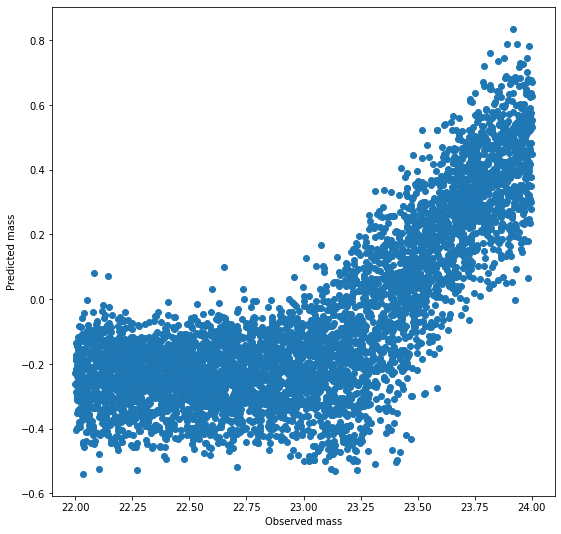

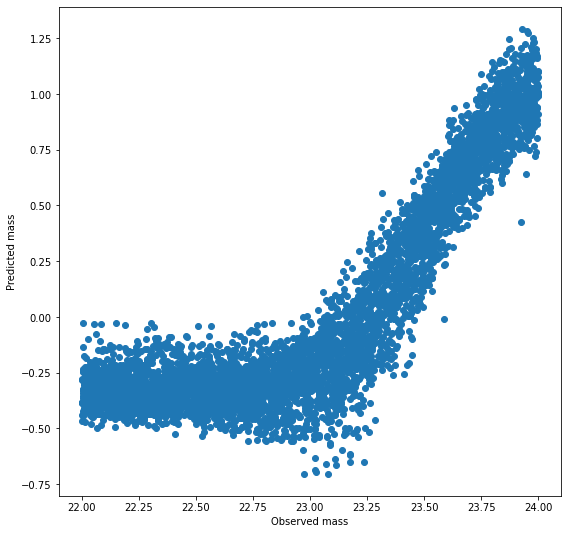

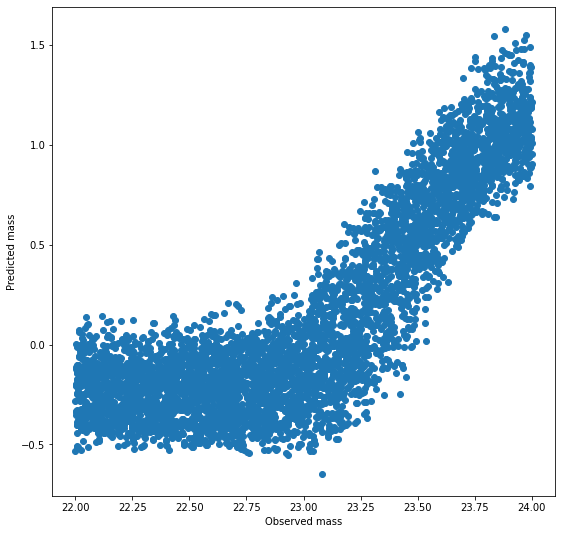

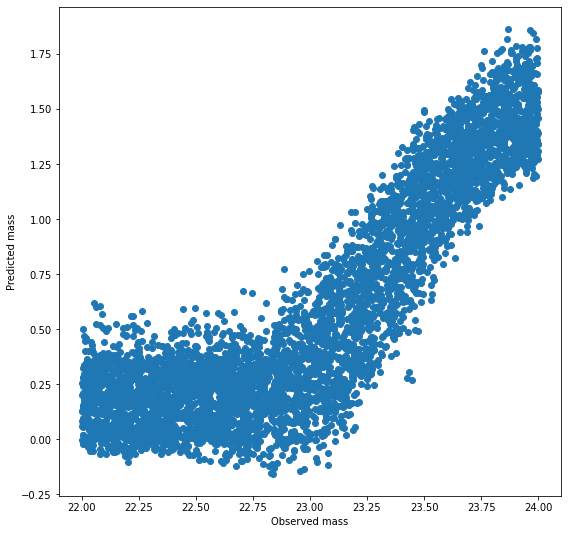

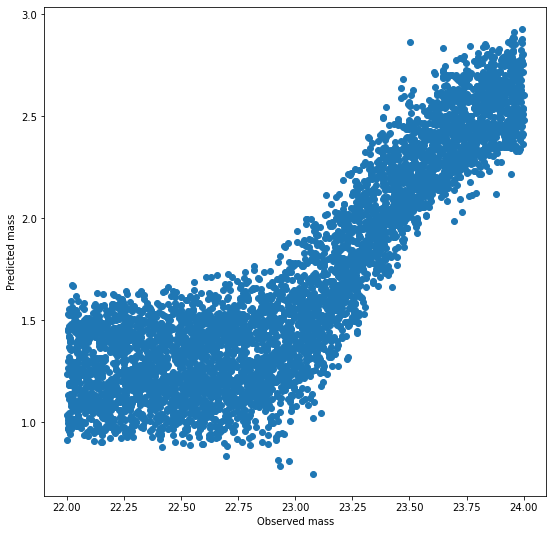

...

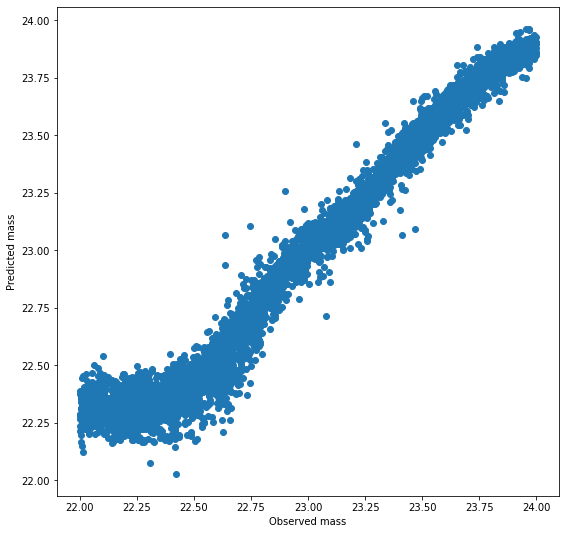

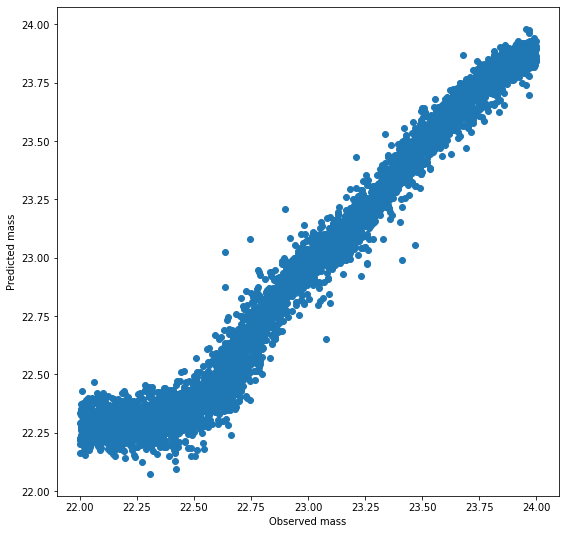

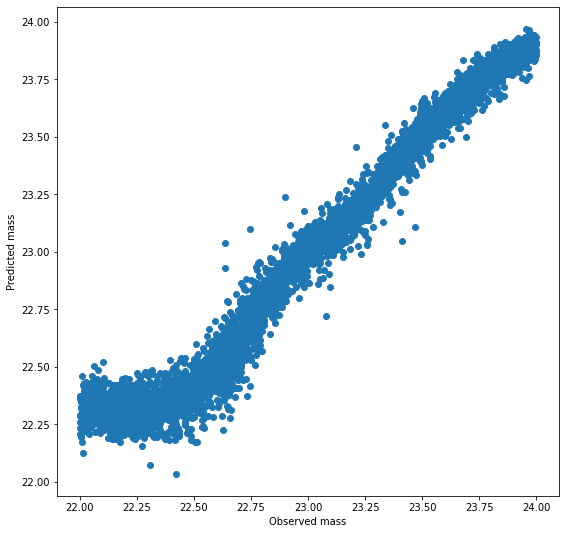

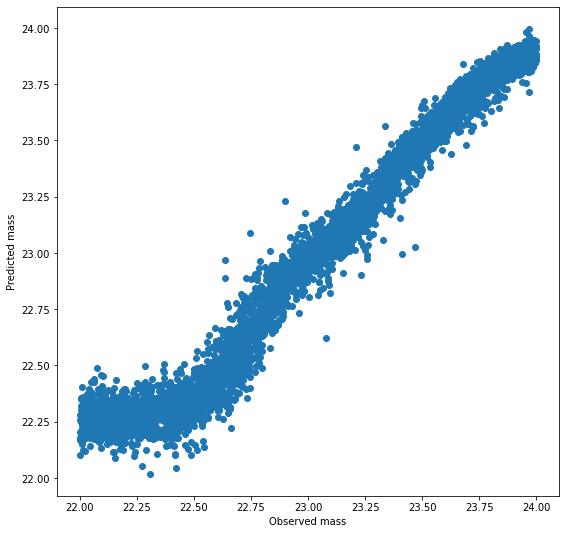

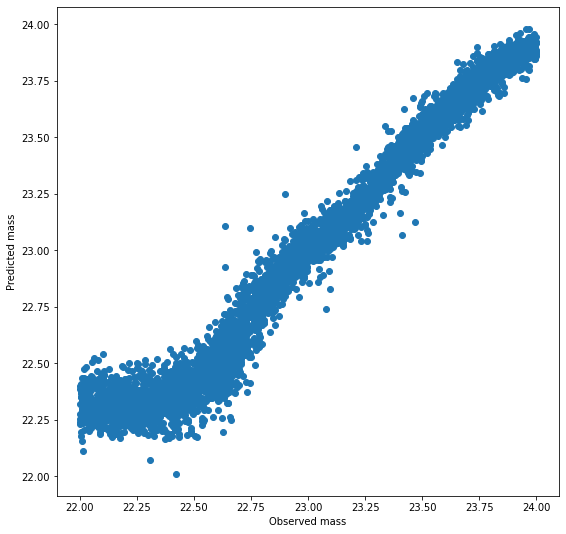

In [24]:
#training and tracking model
PATH = "basic_conv.pth"
model, loss_dict = fit_model(model, config, checkpoint_path = PATH)

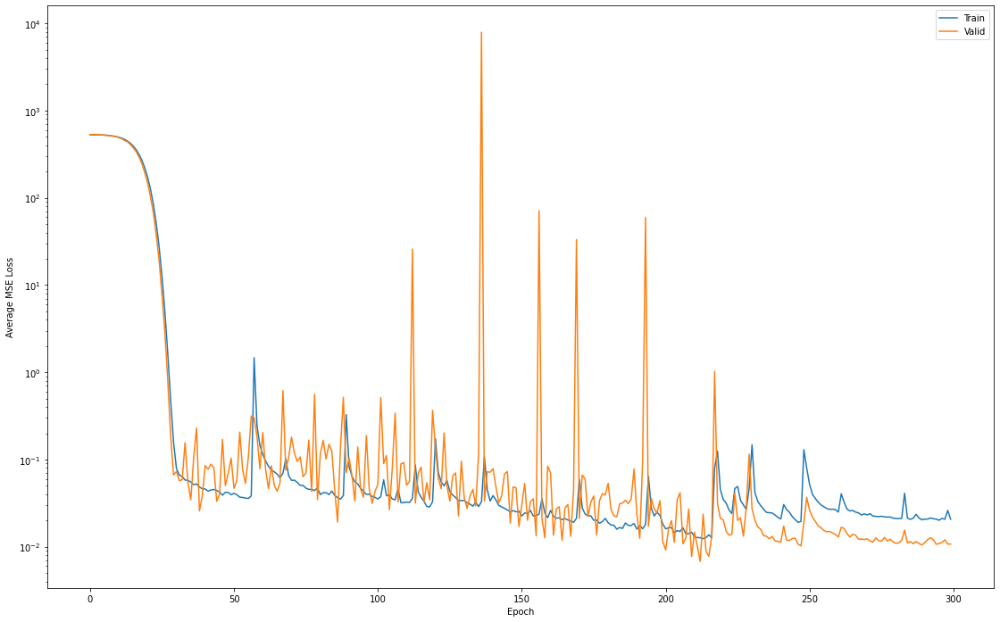

In [25]:
# Plot losses
plt.figure(figsize=(19,12))
plt.semilogy(loss_dict['train_loss'], label='Train')
plt.semilogy(loss_dict['val_loss'], label='Valid')
plt.xlabel('Epoch')
plt.ylabel('Average MSE Loss')
#plt.grid()
plt.legend()
#plt.title('loss')


plot_name = "Loss_history"
plt.savefig(plot_name, format="png", dpi=80)  
pic = Image.open(plot_name)
wandb.log({plot_name: [wandb.Image(pic, caption = f"Train, Val MSE loss history")]})

plt.show()

In [26]:
del model
gc.collect()

model = Regressor().to(device)
model.load_state_dict(torch.load(PATH))

<All keys matched successfully>

In [27]:
criterion = nn.MSELoss()

_, _, train_mse = test_epoch(model, train_loader, criterion)
print("Train set MSE:" + str(train_mse))

_, _, val_mse = test_epoch(model, val_loader, criterion)
print("Val set MSE:" + str(val_mse))

_, _, test_mse = test_epoch(model, test_loader, criterion)
print("Test set MSE:" + str(test_mse))

  0%|          | 0/106 [00:00<?, ?it/s]

Train set MSE:0.0079156


  0%|          | 0/12 [00:00<?, ?it/s]

Val set MSE:0.0068037007


  0%|          | 0/20 [00:00<?, ?it/s]

Test set MSE:0.008444402


In [28]:
scores = [[train_mse, val_mse, test_mse]]

wandb.log({"MSE_Scores": wandb.Table(data = scores, columns=["Train_MSE", "Val_MSE", "Test_MSE"])})

  0%|          | 0/20 [00:00<?, ?it/s]

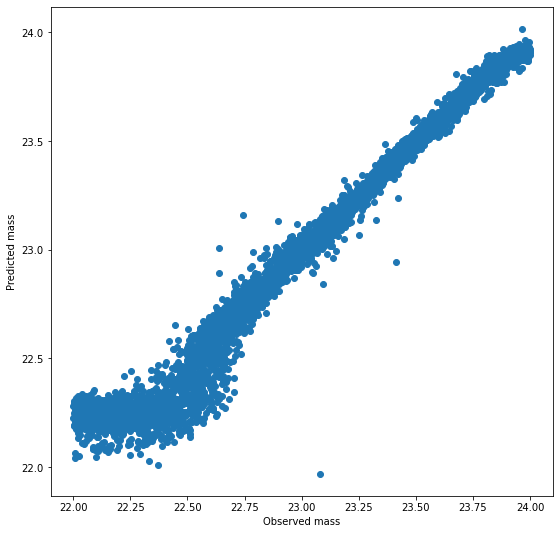

In [29]:
y_pred_list, y_truth_list, test_loss = test_epoch(model, test_loader, criterion)
    
def flatten_list(x):
    flattened_list = []
    for i in x:
        for j in i:
            flattened_list.append(j)

    return flattened_list

y_pred_list_flattened = flatten_list(y_pred_list)
y_truth_list_flattened = flatten_list(y_truth_list)

plt.figure(figsize=(9,9))
plt.scatter(y_truth_list_flattened, y_pred_list_flattened)
plt.xlabel('Observed mass')
plt.ylabel('Predicted mass')

plot_name = f"test_plot"
plt.savefig(plot_name, format="png", dpi=80)  
pic = Image.open(plot_name)

wandb.log({plot_name: [wandb.Image(pic, caption = f"Test Set predictions")]})
plt.show()

In [30]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
train_loss,██▆▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,██▆▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,300
train_loss,0.02072
val_loss,0.01076
